Finally have made my own database connecting Ways and nodes via Nominatim (but not without its problems: street name short form problem).

In [1]:
using Pkg
Pkg.activate(".")
# Only instantiate if an error occurs.
#Pkg.instantiate()
using DataFrames
using SQLite
using Plots
using Dates
using Distributions
using LinearAlgebra
using StatPlots
using StatsBase
using HypothesisTests
using JLD
using LaTeXStrings

┌ Info: Precompiling StatPlots [60ddc479-9b66-56df-82fc-76a74619b69c]
└ @ Base loading.jl:1186


ArgumentError: ArgumentError: Package LaTeXStrings not found in current path:
- Run `Pkg.add("LaTeXStrings")` to install the LaTeXStrings package.


# TODO
- Per-streetsegment statistics
    - How many days out of the year has this been ticketed (frequentist probability)
- What is the distribution of yearly tickets like per ss?
    - Note could be bad if highly segmented ss
- Which streets pass KS test for exponentiality?
- Investigate how to justify exponentiality 
    - https://stats.stackexchange.com/questions/132652/how-to-determine-which-distribution-fits-my-data-best

## Done
- Refactor database with proper datetime column instead of separate date and time columns
- Arpack (needed for Distributions.jl) won't build... try using Julia source binaries.
    - https://discourse.julialang.org/t/arpack-does-not-build-in-1-0-manjaro-linux/14515
- Per-streetsegment time-cluster analysis -- Has exponential distribution?

## Notes
- Improving exponential fit: optimize for daytime (ignore night-time interarrivals)
    - Can we see this in the QQ plot?
    - Also, try optimizing for weekdays vs sat vs sun because they have different distributions
- Improving data collection: Sanitize addresses (e.g., nominatim doesnt find ALESSIA CIRC)
- Accessing the SQLite database on the CSClub servers take an ungodly amount of time

In [2]:
db = SQLite.DB("streetsegdb_2018_09_16/allstreetsegs.db")

SQLite.DB("streetsegdb_2018_09_16/allstreetsegs.db")

In [314]:
randid = SQLite.query(db, "select * from streetsegments where name like 'Elm Street%'")[5,:].osm_id[1]

4652041

In [315]:
randss = SQLite.query(db, "select * from streetsegments where osm_id= :randid", values = Dict(:randid => randid))

,osm_id,name,slat,nlat,wlng,elng
1,4652041,"Elm Street, Discovery District, Old Toronto, Toronto, Ontario, M5T 1V4, Canada",43.6558,43.6563,-79.392,-79.3891


In [316]:
# get all tickets associated with this street segment
randinfractions = SQLite.query(db, "select * from streetsegmentinfraction where osm_id = :randid", 
                                values = Dict(:randid => randid))

,osm_id,code,fine,loc,datetime
1,4652041,29,30,200 ELM ST,2016-01-02T00:23:00
2,4652041,406,40,200 ELM ST,2016-01-02T08:59:00
3,4652041,210,30,222 ELM ST,2016-01-03T18:10:00
4,4652041,8,60,200 ELM ST,2016-01-05T12:42:00
5,4652041,8,60,222 ELM ST,2016-01-06T13:59:00
6,4652041,14,40,222 ELM ST,2016-01-06T17:35:00
7,4652041,8,60,222 ELM ST,2016-01-07T12:20:00
8,4652041,15,100,200 ELM ST,2016-01-07T15:41:00
9,4652041,8,60,222 ELM ST,2016-01-07T19:18:00
10,4652041,8,60,222 ELM ST,2016-01-08T12:55:00


In [320]:
length(unique(Dates.Date.(randinfractions.datetime)))

293

```
timedf = DateFormat("HHMM")
datedf = DateFormat("yyyymmdd")
Dates.Time("1008", timedf)
times = []
for i in 1:length(randinfractions.time)
        push!(times, Dates.Time(lpad(string(randinfractions.time[i]),4,"0"), timedf))
end
convert(Dates.Minute, (times[2] - times[1]))
datedf = DateFormat("yyyymmddHHMM")
i = 50
datestring = string(randinfractions.date[i]) * lpad(string(randinfractions.time[i]), 4, "0")
DateTime(datestring, datedf)
```

There is a noticable spike in tickets at 12:00 pm and 12:00 am. Between 9:00 pm and 12:00 am is a lull in parking ticket activity. 

```{Julia}
# probably will not need to run again
# Code for converting date/time columns into a datetime column

infractions = SQLite.query(db,"select * from streetsegmentinfraction")

infractions[:datetime] = map((x,y) -> DateTime(string(x) * lpad(string(y), 4, "0"), datedf), 
                                infractions[:date],
                                infractions[:time])

delete!(infractions, :date)
delete!(infractions, :time)

# write to a database
SQLite.execute!(db, "drop table if exists streetsegmentinfraction")
SQLite.load(db, "streetsegmentinfraction", infractions)
```

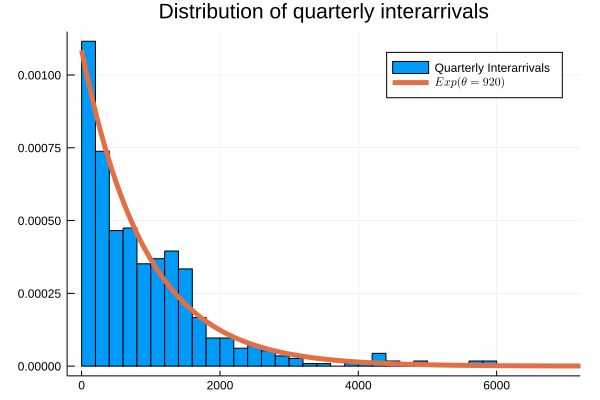

In [333]:
# interarrival times

function get_interarrivals(min_intertime, sorted_vec)
    interarrivals = []
    for i in 1:(length(sorted_vec) - 1)
        if Dates.Minute(sorted_vec[i+1] - sorted_vec[i]) > Dates.Minute(min_intertime)
            push!(interarrivals, Dates.Minute(sorted_vec[i+1] - sorted_vec[i]))
        end
    end
    interarrivals = Dates.value.(interarrivals)
    return interarrivals
end

sorted_dt = sort(randinfractions.datetime)

quarterly_interarrivals = get_interarrivals(15, sorted_dt)
quarterly_expo = fit(Exponential,quarterly_interarrivals)
histogram(quarterly_interarrivals, nbins = 30, normed=true, label="Quarterly Interarrivals", title="Distribution of quarterly interarrivals",
            xlim=[0,7e3])
plot!(quarterly_expo, 1:1.5e4, lw = 5, label=sr"$Exp(\theta=920)$")
savefig("quarterly_interarrivals.png")
plot!()

In [7]:
quarterly_expo = fit(Exponential,quarterly_interarrivals)

Exponential{Float64}(θ=920.6818980667838)

In [8]:
fit_mle(Exponential, quarterly_interarrivals)

Exponential{Float64}(θ=920.6818980667838)

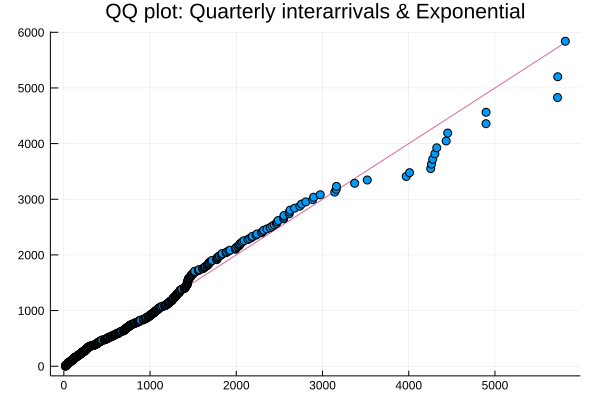

In [339]:
qqplot(quarterly_interarrivals, fit(Exponential, quarterly_interarrivals), 
        title="QQ plot: Quarterly interarrivals & Exponential")
savefig("QQ_quarterly_interarrival_exponential.png")
plot!()

In [10]:
top75 = sort(quarterly_interarrivals)[1:Int(floor(length(quarterly_interarrivals)*1))]
qqplot(top75, fit(Exponential, top75))
ApproximateOneSampleKSTest(top75, fit(Exponential, top75))

┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /users/d49chan/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112


Approximate one sample Kolmogorov-Smirnov test
----------------------------------------------
Population details:
    parameter of interest:   Supremum of CDF differences
    value under h_0:         0.0
    point estimate:          0.047732139228395754

Test summary:
    outcome with 95% confidence: fail to reject h_0
    two-sided p-value:           0.1496

Details:
    number of observations:   569
    KS-statistic:             1.1385891263385957


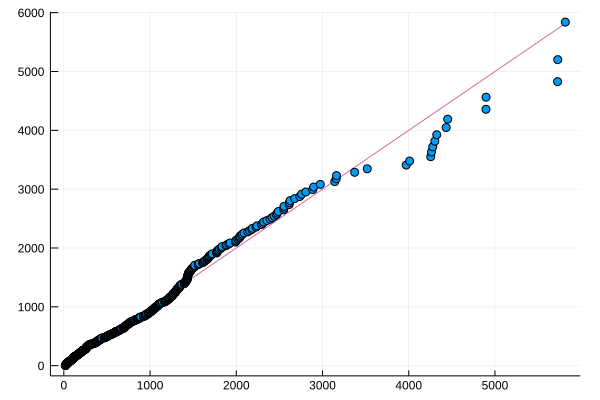

In [11]:
qqplot(top75, fit(Exponential, top75))

The QQ plot suggests that the interarrivals are exponentially distributed.

In [12]:
#kolmogorov-Smirnov test
# tests one sample against a distribution

testresult = ApproximateOneSampleKSTest(quarterly_interarrivals, quarterly_expo)

┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /users/d49chan/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112


Approximate one sample Kolmogorov-Smirnov test
----------------------------------------------
Population details:
    parameter of interest:   Supremum of CDF differences
    value under h_0:         0.0
    point estimate:          0.047732139228395754

Test summary:
    outcome with 95% confidence: fail to reject h_0
    two-sided p-value:           0.1496

Details:
    number of observations:   569
    KS-statistic:             1.1385891263385957


In [13]:
testresult.

LoadError: syntax: incomplete: premature end of input

So here, we've found that for the parameter we fitted above, we fail to reject the null hypothesis of the K-S test, which is to say that the data is sampled from the distribution with a 95% confidence interval. 

Let's also look at the Anderson-Darling test

In [14]:
OneSampleADTest(quarterly_interarrivals, quarterly_expo)

InexactError: InexactError: Int64(Int64, 0.019550726518894074)

We might as well look at the global statistics then

In the case of finding the distribution over all streets, we want to find an estimate $\theta$ for the scale parameter of an exponential distribution that is representative of all streets. 

Let's find the $\theta$ along with a confidence interval by bootstrapping (yikes!)

In [340]:
# Takes a while, don't run unless need to.

numSS = SQLite.query(db, "select count(*) from streetsegments")
minInfractions = 300
β = Int(minInfractions/2)
Β = 1000
interarrival_time = 15

# get all the street segments with more than 300 tickets 
heavyHitters = SQLite.query(db, "select osm_id 
                                 from streetsegmentinfraction 
                                 group by osm_id 
                                 having count(osm_id) >= :mininf",
                                values = Dict(:mininf => minInfractions))
θs = []

for i in 1:Β
    try
        # select random street sample
        #randid = SQLite.query(db, "select osm_id from heavyHitters order by random() limit 1").osm_id[1]
        randid = heavyHitters.osm_id[rand(1:length(heavyHitters.osm_id))]
        randinfractions = SQLite.query(db, "select * from streetsegmentinfraction 
            where osm_id = :randid 
            order by datetime(datetime)",
            values = Dict(:randid => randid))
        d = fit(Exponential, get_interarrivals(interarrival_time, randinfractions.datetime))
        push!(θs, d.θ)
    catch(err)
        println(string(" at: ", randid, " with numinfractions ", length(randinfractions.datetime)))
    end
end
    



In [402]:
θs = Float64.(θs)

1000-element Array{Float64,1}:
 1772.7331081081081
 2473.1844660194174
 2068.4523809523807
 1448.3628808864266
 1193.7767653758542
  692.7954847277556
  884.4878472222222
 1339.2879177377893
 1588.822629969419 
 2120.391666666667 
 1219.0943396226414
 2467.985507246377 
 1138.3463203463205
    ⋮              
 2732.214659685864 
 3748.8571428571427
 2550.151515151515 
 2287.170305676856 
 1091.3949579831933
  804.4884792626729
  708.2289325842696
  906.8400702987698
 2242.493392070485 
 1284.472906403941 
  664.6393861892583
 1734.0170648464164

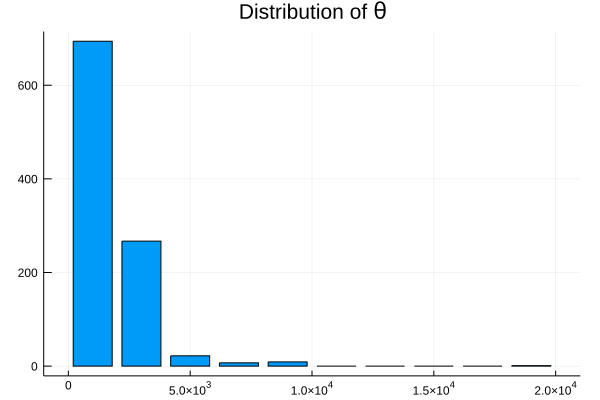

In [415]:
θhist = fit(Histogram, θs)
bar(θhist.edges, θhist.weights, title="Distribution of \\theta", legend=false)
savefig("theta_distr.png")
plot!()

In [17]:
map(x -> quantile(θs, x), [0.05, 0.5, 0.95])

UndefVarError: UndefVarError: θs not defined

Not all of the things are exponentially distributed... Let's see how many

In [342]:
# Takes a long time to run, skip on runall.

testresults = []
for i in 1:length(heavyHitters.osm_id)
    try
        # select random street sample
        #randid = SQLite.query(db, "select osm_id from heavyHitters order by random() limit 1").osm_id[1]
        randid = heavyHitters.osm_id[i][1]
        randinfractions = SQLite.query(db, "select * from streetsegmentinfraction 
            where osm_id = :randid 
            order by datetime(datetime)",
            values = Dict(:randid => randid))
        interarrivals = get_interarrivals(interarrival_time, randinfractions.datetime)
        d = fit(Exponential, interarrivals)
        testresult = ApproximateOneSampleKSTest(interarrivals, d)
        push!(testresults, testresult)
    catch(err)
        println(string(" at: ", randid, " with numinfractions ", length(randinfractions.datetime)))
    end
end

┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /users/d49chan/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /users/d49chan/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /users/d49chan/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /users/d49chan/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /users/d49chan/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /users/d49chan/.julia/packages/HypothesisTests/M3Ysg/src/kolmogorov_smirnov.jl:112
┌ Warning: This test is inaccurate with ties
└ @ HypothesisTests /users/d49chan/.julia/packages/HypothesisTests/

In [351]:
using JLD2

┌ Info: Precompiling JLD2 [033835bb-8acc-5ee8-8aae-3f567f8a3819]
└ @ Base loading.jl:1186


In [352]:
@save "heavyhitters.jld2" θs testresults

In [20]:
unique(Dates.Date.(randinfractions.datetime))

293-element Array{Date,1}:
 2016-01-02
 2016-01-03
 2016-01-05
 2016-01-06
 2016-01-07
 2016-01-08
 2016-01-09
 2016-01-11
 2016-01-12
 2016-01-13
 2016-01-15
 2016-01-16
 2016-01-19
 ⋮         
 2016-12-12
 2016-12-13
 2016-12-14
 2016-12-16
 2016-12-19
 2016-12-20
 2016-12-21
 2016-12-22
 2016-12-23
 2016-12-24
 2016-12-28
 2016-12-31

In [13]:
@time streetsegs = SQLite.query(db, "select * from streetsegments")

  0.535047 seconds (333.30 k allocations: 9.960 MiB, 9.14% gc time)


,osm_id,name,slat,nlat,wlng,elng
1,36746601,"Goldhawk Trail, Scarborough, Toronto, Ontario, M1V 1W5, Canada",43.8213,43.8221,-79.2829,-79.2825
2,35599327,"Brookview Drive, Lawrence Manor, North York, Toronto, Ontario, M6A 2A1, Canada",43.719,43.7192,-79.4355,-79.4354
3,444665350,"Lowe's Place, Pine Point, Etobicoke, Toronto, Ontario, M9P 3P1, Canada",43.7077,43.7082,-79.5494,-79.5461
4,108852658,"Tomar Villaway, Concord Park Place, North York, Toronto, Ontario, M2J 2K9, Canada",43.7765,43.7767,-79.3653,-79.3652
5,23102414,"Lane North Queen East Ryerson, Alexandra Park, Old Toronto, Toronto, Ontario, M5T 1A4, Canada",43.6481,43.6483,-79.4022,-79.4007
6,27658883,"Adra Villaway, Concord Park Place, North York, Toronto, Ontario, M2K 2S5, Canada",43.7759,43.7764,-79.3675,-79.3649
7,546845797,"Saguenay Avenue, North York, Toronto, Ontario, M6B 3B1, Canada",43.7178,43.7186,-79.4208,-79.4206
8,37407109,"Wilket Road, The Bridle Path, North York, Toronto, Ontario, M2L 1A9, Canada",43.7436,43.7448,-79.3827,-79.3818
9,37407114,"Wilket Road, The Bridle Path, North York, Toronto, Ontario, M2L 1A9, Canada",43.7448,43.7454,-79.3818,-79.3803
10,23959452,"Berkindale Drive, Bayview Village, North York, Toronto, Ontario, M2L 2K4, Canada",43.7524,43.7545,-79.384,-79.3836


In [ ]:
histogram(map(length, uniquedays))
ApproximateOneSampleKSTest(map(length, uniquedays), fit(Laplace, map(length,uniquedays)))

Global trends per hour

In [15]:
@time streetseginfs = SQLite.query(db, "select * from streetsegmentinfraction")

146.418088 seconds (131.34 M allocations: 6.174 GiB, 9.66% gc time)


,osm_id,code,fine,loc,datetime
1,24962816,29,30,49 GLOUCESTER ST,2016-01-01T00:00:00
2,69844659,29,30,45 GLOUCESTER ST,2016-01-01T00:01:00
3,5088685,29,30,274 GEORGE ST,2016-01-01T00:02:00
4,5088685,29,30,270 GEORGE ST,2016-01-01T00:02:00
5,69844659,406,40,45 GLOUCESTER ST,2016-01-01T00:02:00
6,23973402,3,30,621 KING ST W,2016-01-01T00:03:00
7,69844659,29,30,43 GLOUCESTER ST,2016-01-01T00:03:00
8,24962816,29,30,39 GLOUCESTER ST,2016-01-01T00:04:00
9,24962816,406,40,39 GLOUCESTER ST,2016-01-01T00:04:00
10,24962816,29,30,31 GLOUCESTER ST,2016-01-01T00:05:00


In [ ]:
histogram(Dates.hour.(streetsegs.datetime))

In [ ]:
# seasonal trends?

# winter is dec 21 to march 20

testdate = streetsegs.datetime[rand(1:1000000)]



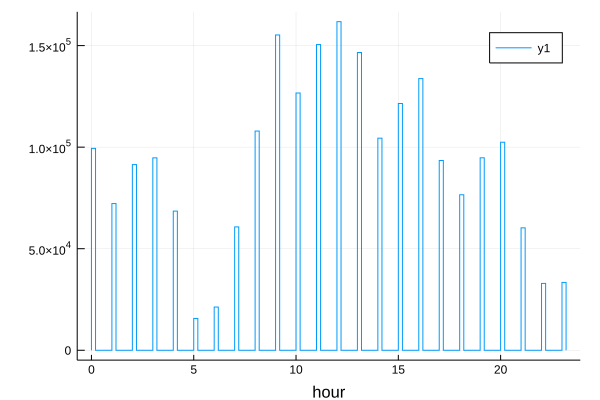

In [17]:
histogram(Dates.hour.(streetseginfs.datetime), xlab = "hour")

In [28]:
θ = range(0, length=24, stop=2*pi)
r = rand(0:20, 24)

MethodError: MethodError: no method matching MethodError(::String)
Closest candidates are:
  MethodError(::Any, !Matched::Any) at boot.jl:289
  MethodError(::Any, !Matched::Any, !Matched::UInt64) at boot.jl:286

In [343]:
using JLD

ArgumentError: ArgumentError: Package JLD not found in current path:
- Run `Pkg.add("JLD")` to install the JLD package.


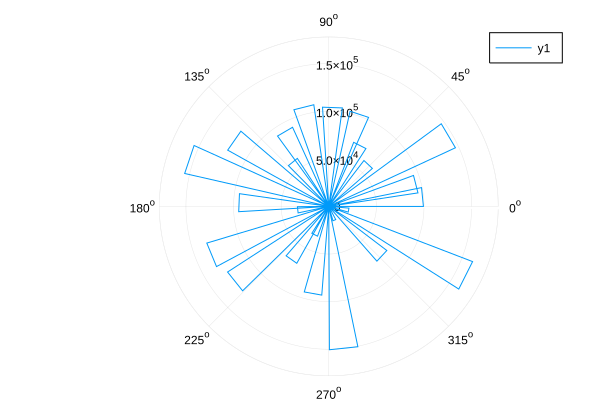

In [61]:
histogram(Dates.hour.(streetseginfs.datetime), xticks=0:23, proj=:polar)

In [91]:
# Essentially forked from https://github.com/anowacki/assorted-julia-modules/blob/c3a50ce80949bc17d06ea21a91d07e67feeab9e4/CircPlot.jl
R = 3
p = plot(aspect_ratio=:equal, xlim=(-R,R), ylim=(-R,R), legend=false)
number_of_segments(θ₁, θ₂) = max(2, round(Int, abs(θ₂ - θ₁)*90/π))
arc(θ₁, θ₂, r=1, x=0, y=0) = [(x+r*cos(θ), y+r*sin(θ)) for θ in range(θ₁,length=number_of_segments(θ₁, θ₂), stop=θ₂)]
circle(r, x=0, y=0) = Shape(arc(0, 2π, r, x, y))
sector(θ₁, θ₂, r=1, x=0, y=0)::Shape =
    Shape(vcat(arc(θ₁, θ₂, r, x, y), Tuple{Float64,Float64}((x, y))))

sector (generic function with 4 methods)

In [87]:
hourdata = Dates.hour.(streetseginfs.datetime)

2226094-element Array{Int64,1}:
  0
  0
  0
  0
  0
  0
  0
  0
  0
  0
  0
  0
  0
  ⋮
 23
 23
 23
 23
 23
 23
 23
 23
 23
 23
 23
 23

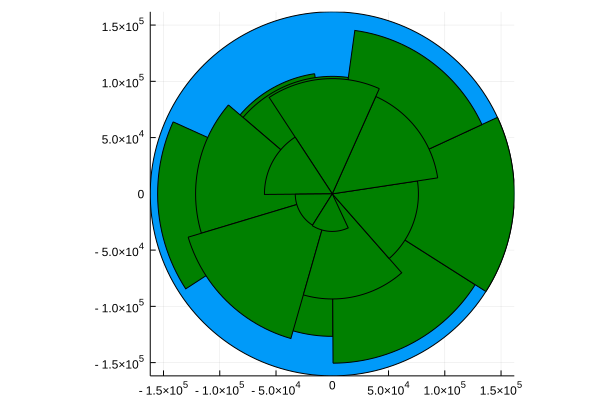

In [97]:
R = maximum(hist.weights)
p = plot(xlim=(-R,R), ylim=(-R,R), aspect_ratio=:equal,legend=false)
plot(p)
plot!(p,circle(R))
hist = fit(Histogram, hourdata)
n = length(hist.weights)
edges = hist.edges[1]
plot!(p,sector.(edges[1:n], edges[2:n+1], hist.weights), fill=:green)

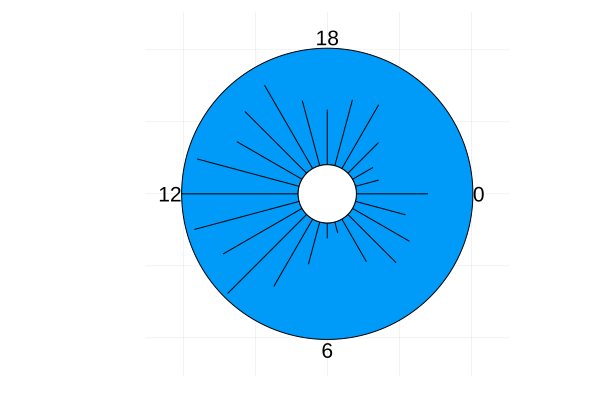

In [135]:
# lmao such effort

R = maximum(hist.weights)
innerdiam = R*0.25
R += innerdiam
p = plot(xlim=(-1.25*R,1.25*R), ylim=(-1.25*R,1.25*R), aspect_ratio=:equal,legend=false)
plot(p)
plot!(p,circle(R))
hist = fit(Histogram, hourdata)
n = length(hist.weights)
edges = hist.edges[1]
#plot!(p,sector.(edges[1:n], edges[2:n+1], hist.weights), fill=:green)
plot!(circle(innerdiam), fill=:white)

for i in 0:23
    θ = -2π*i/n
    x = innerdiam*cos(θ)
    y = innerdiam*sin(θ)
    plot!(Shape([x,(innerdiam + hist.weights[i+1])*cos(θ)], [y, (innerdiam + hist.weights[i+1])*sin(θ)]))
end

annotate!([
        (R*cos(0), R*sin(0), text("0", :left)),
        (R*cos(π/2), R*sin(π/2), text("18", :bottom)),
        (R*cos(π), R*sin(π), text("12", :right)),
        (R*cos(3*π/2), R*sin(3*π/2), text("6", :top)),
        ])

plot!(circle(innerdiam), fill=:white, xaxis=false, yaxis=false)


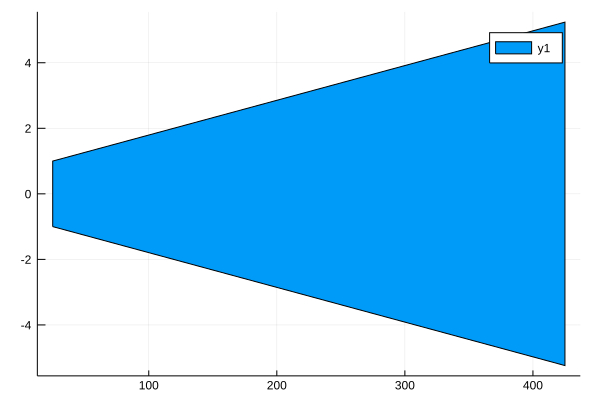

In [105]:
plot(Shape([25, 425, 425, 25], [-1, -5.24, 5.24, 1]))

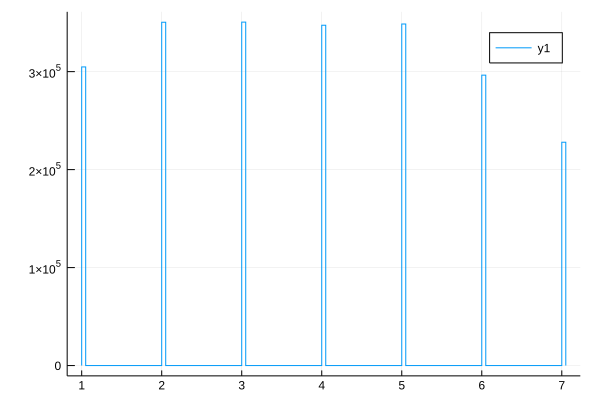

In [144]:
histogram(Dates.dayofweek.(streetseginfs.datetime))

In [156]:
testdat = [Dates.hour(x) for x in streetseginfs.datetime if Dates.dayofweek(x) == 1]

304804-element Array{Int64,1}:
  0
  0
  0
  0
  0
  0
  0
  0
  0
  0
  0
  0
  0
  ⋮
 23
 23
 23
 23
 23
 23
 23
 23
 23
 23
 23
 23

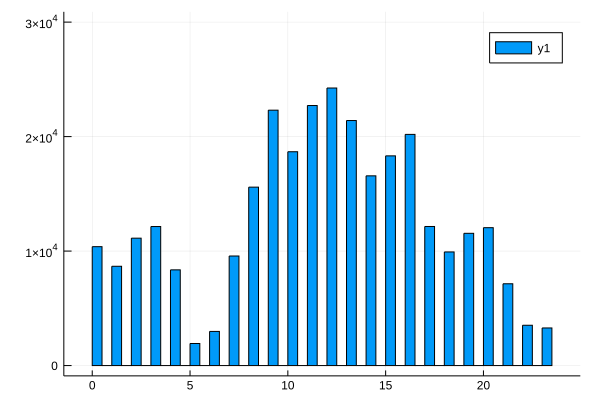

In [187]:
histogram(testdat, ylim=[0,3e4])

In [190]:

anim = @animate for i=1:7
    dat = [Dates.hour(x) for x in streetseginfs.datetime if Dates.dayofweek(x) == i]
    histogram(dat, title=Dates.dayname(i), nbins=23, ylim=[0,3e4],legend=false)
end

gif(anim, "hourly_by_day.gif", fps = 1)

┌ Info: Saved animation to 
│   fn = /users/d49chan/toronto_parking_tickets/hourly_by_day.gif
└ @ Plots /users/d49chan/.julia/packages/Plots/EJpx2/src/animation.jl:90


Plots.AnimatedGif("/users/d49chan/toronto_parking_tickets/hourly_by_day.gif")

![](hourly_by_day.gif)

In [198]:
# for each streetsegment, how many days out of the year has a cop actually visited?

# Takes a while to run

uniquedays = []

@time for i in 1:length(streetsegs.osm_id)
    # get all the infractions associated
    id = streetsegs.osm_id[i]
    infs = streetseginfs[streetseginfs[:osm_id] .== id, :]
    push!(uniquedays, unique(Dates.Date.(infs.datetime)))
end
    

1306.080315 seconds (5.41 M allocations: 5.376 GiB, 0.09% gc time)


In [312]:
boxplot(1:5, length.(uniquedays), legend=false, outliers=false, title="Street segment ticket frequency by day",
            ylabel = "Days", xlim=[0,2], xaxis=false)
savefig("streetseg_freq_by_day.png")

In [313]:
median(length.(uniquedays))

8.0

In [215]:
winterinfs = [x for x in streetseginfs.datetime if 
                Dates.monthday(x) < Dates.monthday(Dates.Date("2016-03-20")) ||
                Dates.monthday(x) >= Dates.monthday(Dates.Date("2016-12-21"))]
springinfs = [x for x in streetseginfs.datetime if 
                Dates.monthday(x) >= Dates.monthday(Dates.Date("2016-03-20")) &&
                Dates.monthday(x) < Dates.monthday(Dates.Date("2016-06-21"))]
summerinfs = [x for x in streetseginfs.datetime if 
                Dates.monthday(x) >= Dates.monthday(Dates.Date("2016-06-21")) &&
                Dates.monthday(x) < Dates.monthday(Dates.Date("2016-09-22"))]
fallinfs = [x for x in streetseginfs.datetime if 
                Dates.monthday(x) >= Dates.monthday(Dates.Date("2016-09-22")) &&
                Dates.monthday(x) < Dates.monthday(Dates.Date("2016-12-21"))]
                                                


537477-element Array{DateTime,1}:
 2016-09-22T00:00:00
 2016-09-22T00:01:00
 2016-09-22T00:02:00
 2016-09-22T00:02:00
 2016-09-22T00:03:00
 2016-09-22T00:04:00
 2016-09-22T00:05:00
 2016-09-22T00:05:00
 2016-09-22T00:05:00
 2016-09-22T00:05:00
 2016-09-22T00:05:00
 2016-09-22T00:06:00
 2016-09-22T00:06:00
 ⋮                  
 2016-12-20T23:48:00
 2016-12-20T23:49:00
 2016-12-20T23:50:00
 2016-12-20T23:50:00
 2016-12-20T23:51:00
 2016-12-20T23:51:00
 2016-12-20T23:53:00
 2016-12-20T23:55:00
 2016-12-20T23:55:00
 2016-12-20T23:56:00
 2016-12-20T23:56:00
 2016-12-20T23:57:00

In [243]:
winterhist = fit(Histogram, Dates.hour.(winterinfs))
springhist = fit(Histogram, Dates.hour.(springinfs))

Histogram{Int64,1,Tuple{StepRangeLen{Float64,Base.TwicePrecision{Float64},Base.TwicePrecision{Float64}}}}
edges:
  0.0:1.0:24.0
weights: [27664, 19545, 22960, 23663, 17481, 3925, 6125, 16009, 28965, 43321  …  29211, 33044, 36823, 25896, 21478, 25346, 27320, 15684, 8461, 9085]
closed: left
isdensity: false

In [258]:
winterhist.weights

24-element Array{Int64,1}:
 22927
 15385
 25453
 23914
 16191
  3662
  4183
 12401
 23331
 32606
 27813
 36370
 40859
 36451
 24998
 30313
 33125
 22543
 18016
 23591
 25294
 12292
  6696
  7237

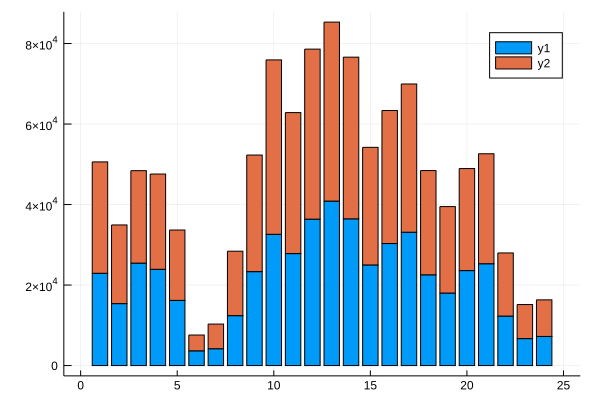

In [247]:
groupedbar(hcat(winterhist.weights, springhist.weights), bar_position=:stack)

In [259]:
allhists = foldl(hcat, map(x -> fit(Histogram, Dates.hour.(x)).weights,
                    [winterinfs, springinfs, summerinfs, fallinfs]))

┌ Warning: Default for keyword argument "closed" has changed from :right to :left.
│ To avoid this warning, specify closed=:right or closed=:left as appropriate.
│   caller = #fit#106 at hist.jl:340 [inlined]
└ @ Core /users/d49chan/.julia/packages/StatsBase/NzjNi/src/hist.jl:340


24×4 Array{Int64,2}:
 22927  27664  26002  22812
 15385  19545  19100  18196
 25453  22960  20310  22695
 23914  23663  22991  24165
 16191  17481  17698  17150
  3662   3925   4016   4063
  4183   6125   6722   4244
 12401  16009  17029  15298
 23331  28965  28931  26694
 32606  43321  39435  39874
 27813  35027  31197  32621
 36370  42237  35791  36114
 40859  44457  38800  37666
 36451  40160  35036  34957
 24998  29211  25166  25045
 30313  33044  30593  27542
 33125  36823  33620  30183
 22543  25896  23441  21550
 18016  21478  19052  18015
 23591  25346  23542  22275
 25294  27320  24947  24855
 12292  15684  17307  14986
  6696   8461   9180   8572
  7237   9085   9173   7905

In [289]:
groupedbar(allhists, bar_position=:stack, legend=["Winter", "Spring", "Summer", "Fall"])

MethodError: MethodError: no method matching convertLegendValue(::String)
Closest candidates are:
  convertLegendValue(!Matched::Nothing) at /users/d49chan/.julia/packages/Plots/EJpx2/src/args.jl:1189
  convertLegendValue(!Matched::Bool) at /users/d49chan/.julia/packages/Plots/EJpx2/src/args.jl:1188
  convertLegendValue(!Matched::Symbol) at /users/d49chan/.julia/packages/Plots/EJpx2/src/args.jl:1178
  ...

In [284]:
seasons = ["Winter", "Spring", "Summer", "Fall"]
anim = @animate for i=1:4
    bar(allhists[:,i], title=seasons[i], nbins=23, ylim=[0,5e4],legend=false)
end

gif(anim, "hourly_by_season.gif", fps = 1)

┌ Info: Saved animation to 
│   fn = /users/d49chan/toronto_parking_tickets/hourly_by_season.gif
└ @ Plots /users/d49chan/.julia/packages/Plots/EJpx2/src/animation.jl:90


Plots.AnimatedGif("/users/d49chan/toronto_parking_tickets/hourly_by_season.gif")

![](hourly_by_season.gif)

In [280]:
allhists[:,1] == winterhist.weights

true

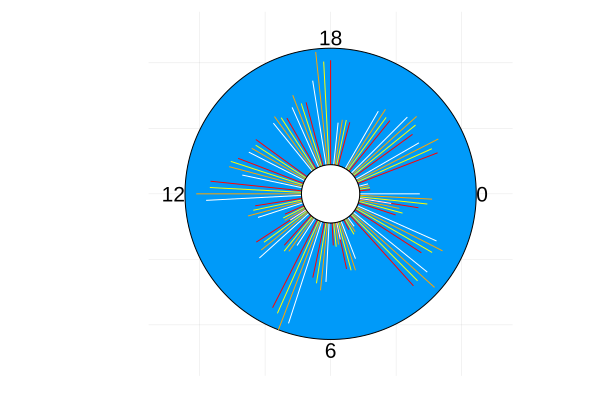

In [274]:
# Compare seasonally 

R = maximum(allhists)
innerdiam = R*0.25
R += innerdiam
p = plot(xlim=(-1.25*R,1.25*R), ylim=(-1.25*R,1.25*R), aspect_ratio=:equal,legend=false)
plot(p)
plot!(p,circle(R))
hist = allhists
n = reduce(*,size(allhists)) + size(allhists)[1]
#edges = hist.edges[1]
#plot!(p,sector.(edges[1:n], edges[2:n+1], hist.weights), fill=:green)
plot!(circle(innerdiam), fill=:white)
colorpick = [:white, :orange, :yellow, :red]
for i in 0:23
    for j in 0:4
        if j != 4
            indi = i*23 + j
            θ = -2π*(indi)/n
            x = innerdiam*cos(θ)
            y = innerdiam*sin(θ)
            plot!(Shape([x,(innerdiam + hist[i+1,j+1])*cos(θ)], [y, (innerdiam + hist[i+1,j+1])*sin(θ)]), linecolor=colorpick[j+1])
        end
    end
end

annotate!([
        (R*cos(0), R*sin(0), text("0", :left)),
        (R*cos(π/2), R*sin(π/2), text("18", :bottom)),
        (R*cos(π), R*sin(π), text("12", :right)),
        (R*cos(3*π/2), R*sin(3*π/2), text("6", :top)),
        ])

plot!(circle(innerdiam), fill=:white, xaxis=false, yaxis=false)
